In [2]:
#import usual packages for data manipulation
import pandas as pd
import numpy as np

#import usual packages for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

#import yfinance to get stock data
import yfinance as yf

#import quantstats to get some statistics on the stock data
import quantstats as qs

#import statistical packages
import statsmodels.api as sm
import scipy.stats as scs

#import datetime to get the current date
import datetime as dt

#set the style of the plots
plt.style.use('seaborn-v0_8-whitegrid')

In [3]:
#create a list of 30 tickers
list_tickers = ['AAPL', 'MSFT', 'AMZN', 'NVDA', 'GOOG', 'META', 'TSLA', 'BRK-B', 'JPM', 'JNJ', 'V', 'WMT', 'UNH', 'MA', 'PG', 'PYPL', 'HD', 'BAC', 'DAL', 'GE', 'GS', 'C', 'SPGI', 'NFLX', 'LLY', 'MU', 'CSCO', 'INTC']

In [11]:
#download last 4 years of stock data for the tickers
start_date = dt.datetime.today()-dt.timedelta(days = 365*10)
end_date = dt.datetime.today() - dt.timedelta(days = 1)
data = yf.download(list_tickers,  start=start_date, end=end_date)

[*********************100%%**********************]  28 of 28 completed


In [38]:
#make a copy of the data in case we screw something up later
df = data.copy()
df

Price        Adj Close                                                \
Ticker            AAPL        AMZN        BAC       BRK-B          C   
Date                                                                   
2014-08-12   21.327770   15.966000  12.423574  133.059998  37.400738   
2014-08-13   21.610008   16.313999  12.456246  133.080002  37.640083   
2014-08-14   21.667793   16.660500  12.513421  135.300003  37.933483   
2014-08-15   21.774462   16.681499  12.431743  134.339996  37.616920   
2014-08-18   22.036701   16.726500  12.619603  135.029999  38.226883   
...                ...         ...        ...         ...        ...   
2024-08-02  219.860001  167.899994  37.580002  428.359985  58.199997   
2024-08-05  209.270004  161.020004  36.650002  413.720001  56.209999   
2024-08-06  207.229996  161.929993  36.919998  422.140015  56.560001   
2024-08-07  209.820007  162.770004  37.299999  427.019989  56.110001   
2024-08-08  213.309998  165.800003  38.209999  431.540009  58.000000   

Price                                                                 ...  \
Ticker           CSCO        DAL          GE        GOOG          GS  ...   
Date                                                                  ...   
2014-08-12  18.389479  32.380745  103.892998   28.027569  142.088531  ...   
2014-08-13  18.426046  33.054794  104.785515   28.627735  142.121490  ...   
2014-08-14  17.943449  34.057003  104.988319   28.621262  142.418320  ...   
2014-08-15  17.863026  34.172298  104.014717   28.562988  141.734009  ...   
2014-08-18  18.009256  35.041451  105.759125   28.995308  143.918884  ...   
...               ...        ...         ...         ...         ...  ...   
2024-08-02  46.660000  39.830002  160.279999  168.399994  470.640015  ...   
2024-08-05  44.740002  37.930000  158.360001  160.639999  459.019989  ...   
2024-08-06  45.160000  38.220001  162.270004  160.539993  470.220001  ...   
2024-08-07  45.119999  37.320000  162.130005  160.750000  473.010010  ...   
2024-08-08  45.830002  39.610001  165.610001  163.839996  485.769989  ...   

Price         Volume                                                      \
Ticker            MU      NFLX       NVDA        PG        PYPL     SPGI   
Date                                                                       
2014-08-12  21496400  10845100  296152000   6591200         NaN   632700   
2014-08-13  17832900   9058000  256596000   5472200         NaN  1220400   
2014-08-14  16873700   6676600  255992000   5930700         NaN  1218500   
2014-08-15  20560700  22036700  369796000   7418400         NaN  1226700   
2014-08-18  17508600  13496000  284076000   8450500         NaN  1095500   
...              ...       ...        ...       ...         ...      ...   
2024-08-02  36039400   3523000  482027500  11899000  23117100.0  1214400   
2024-08-05  36977600   4044200  552842400  10338800  17445400.0  1562600   
2024-08-06  26460000   4319100  409012100   7454900  14358900.0  1473500   
2024-08-07  29483800   3187800  411440400   8385500  13464400.0  1305900   
2024-08-08  24011800   3279300  390385700   6380100   9748200.0   907800   

Price                                               
Ticker           TSLA      UNH         V       WMT  
Date                                                
2014-08-12   95734500  3206200   6442000  11784600  
2014-08-13  103989000  3049900   6451200  19857300  
2014-08-14   61899000  2241100   7136800  18408900  
2014-08-15   58018500  2442700   8999600  20828100  
2014-08-18   87738000  2795800   8352400  12047100  
...               ...      ...       ...       ...  
2024-08-02   82880100  5094000   7017900  23578700  
2024-08-05  100308800  4587400   9631300  20770500  
2024-08-06   73783900  3216500  21586800  14815100  
2024-08-07   71159800  4320700  12908600  18499200  
2024-08-08   64805000  2853900   8223300  12472400  

[2515 rows x 168 columns]

In [73]:
daily_mean = np.log(np.mean([df[col,'AAPL'] for col in ['High', 'Low', 'Close']], axis = 0))
def vwap(tail=30):
    vol_wts = df['Volume','AAPL'][-tail:]/np.sum(df['Volume','AAPL'][-tail:])
    return np.dot(daily_mean[-tail:], vol_wts)

5.395633156475857

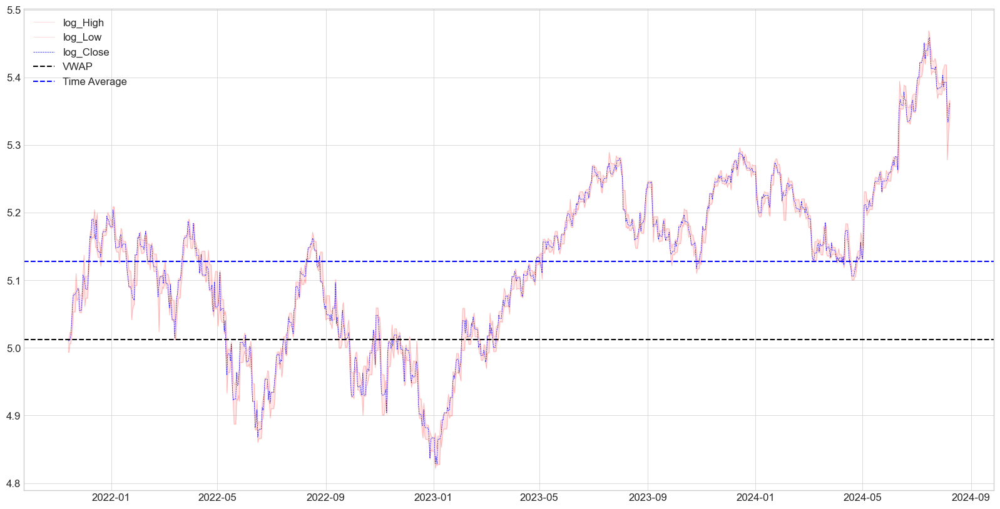

In [81]:
tail=1000
plt.figure(figsize = (20,10))
plt.plot(log_df['log_High', 'AAPL'][-tail:], label = 'log_High', color = 'red', alpha = 0.2,linewidth=0.5)
plt.plot(log_df['log_Low', 'AAPL'][-tail:], label = 'log_Low',c='red',alpha=0.2,linewidth=0.5)
plt.plot(log_df['log_Close', 'AAPL'][-tail:], label = 'log_Close',c='blue',linewidth=0.5,linestyle='--')
plt.axhline(y=vwap(tail), color='black', linestyle='--', label='VWAP')
plt.axhline(y=np.mean(log_df['log_Close', 'AAPL'][-tail:]), color='blue', linestyle='--', label='Time Average')
#shade the redion between the high and low
plt.fill_between(log_df['log_High', 'AAPL'][-tail:].index, log_df['log_High', 'AAPL'][-tail:], log_df['log_Low', 'AAPL'][-tail:], color = 'red', alpha = 0.1)
plt.legend()
plt.show()

In [100]:
aapl = yf.Ticker('AAPL')
aapl_history = aapl.history(period='2y', interval='1h')
aapl_history['Daily'] = np.mean([aapl_history[col] for col in ['High', 'Low', 'Close']], axis = 0)
aapl_history.drop(columns = ['Open', 'High', 'Low', 'Close', 'Dividends', 'Stock Splits'], inplace = True)
aapl_history

,Volume,Daily
Datetime,,
2022-08-10 09:30:00-04:00,19981518,167.629562
2022-08-10 10:30:00-04:00,7674021,167.746867
2022-08-10 11:30:00-04:00,5725051,167.949997
2022-08-10 12:30:00-04:00,4701382,168.061666
2022-08-10 13:30:00-04:00,5054072,168.299998
...,...,...
2024-08-09 11:30:00-04:00,3993538,214.883372
2024-08-09 12:30:00-04:00,3806159,215.861699
2024-08-09 13:30:00-04:00,3531367,215.659999


In [102]:
#for each day, calculate the volume weights of the intra-day prices
aapl_history['Vol_wts'] = aapl_history['Volume'] / aapl_history['Volume'].groupby(aapl_history.index.date).transform('sum')
aapl_history['Vol_wts']

Datetime
2022-08-10 09:30:00-04:00    0.333519
2022-08-10 10:30:00-04:00    0.128090
2022-08-10 11:30:00-04:00    0.095559
2022-08-10 12:30:00-04:00    0.078473
2022-08-10 13:30:00-04:00    0.084359
                               ...   
2024-08-09 11:30:00-04:00    0.119508
2024-08-09 12:30:00-04:00    0.113900
2024-08-09 13:30:00-04:00    0.105677
2024-08-09 14:30:00-04:00    0.126473
2024-08-09 15:30:00-04:00    0.156770
Name: Vol_wts, Length: 3505, dtype: float64

In [103]:
test_df = aapl_history.groupby(aapl_history.index.date).apply(lambda x: np.dot(x['Daily'], x['Vol_wts']))
test_df

2022-08-10    168.135189
2022-08-11    169.505462
2022-08-12    171.001226
2022-08-15    172.601670
2022-08-16    172.702746
                 ...    
2024-08-05    207.934448
2024-08-06    206.285538
2024-08-07    210.976457
2024-08-08    212.459837
2024-08-09    215.133233
Length: 503, dtype: float64

In [95]:
#create a column for the intra-day volume weighted average price
aapl_history['VWAP'] = aapl_history['Daily'] * aapl_history['Vol_wts']
aapl_history

,Volume,Daily,Volume_sum,Vol_wts,VWAP
Datetime,,,,,
2022-08-10 09:30:00-04:00,19981518,167.629562,59911172,0.333519,55.907655
2022-08-10 10:30:00-04:00,7674021,167.746867,59911172,0.128090,21.486693
2022-08-10 11:30:00-04:00,5725051,167.949997,59911172,0.095559,16.049132
2022-08-10 12:30:00-04:00,4701382,168.061666,59911172,0.078473,13.188226
2022-08-10 13:30:00-04:00,5054072,168.299998,59911172,0.084359,14.197691
...,...,...,...,...,...
2024-08-09 11:30:00-04:00,3993538,214.883372,33416591,0.119508,25.680205
2024-08-09 12:30:00-04:00,3806159,215.861699,33416591,0.113900,24.586708
2024-08-09 13:30:00-04:00,3531367,215.659999,33416591,0.105677,22.790314


In [42]:
#Create a new dataframe with the log of the stock data
log_df = pd.DataFrame({(f'log_{col}', ticker): np.log(df[col, ticker]) for col in ['High', 'Low', 'Open', 'Close','Volume'] for ticker in list_tickers})

#for each missing date, add a row with the previous day's data
log_df = log_df.resample('D').ffill()

#check the result
log_df

log_High                                                    \
                AAPL      MSFT      AMZN      NVDA      GOOG      META   
Date                                                                     
2014-08-12  3.187179  3.774828  2.776674 -0.744440  3.339943  4.294970   
2014-08-13  3.190888  3.788272  2.808559 -0.735533  3.355896  4.307438   
2014-08-14  3.194276  3.793690  2.815678 -0.740239  3.360927  4.309187   
2014-08-15  3.200610  3.804438  2.818398 -0.736577  3.363485  4.312811   
2014-08-16  3.200610  3.804438  2.818398 -0.736577  3.363485  4.312811   
...              ...       ...       ...       ...       ...       ...   
2024-08-04  5.418764  6.028279  5.128537  4.688776  5.137033  6.216905   
2024-08-05  5.363637  5.994061  5.093505  4.638702  5.111626  6.181010   
2024-08-06  5.347060  6.005540  5.106430  4.679442  5.089755  6.219715   
2024-08-07  5.364292  6.016352  5.121461  4.689511  5.104672  6.234705   
2024-08-08  5.366910  6.006008  5.116136  4.658711  5.108971  6.234332   

                                                    ... log_Volume             \
                TSLA     BRK-B       JPM       JNJ  ...        DAL         GE   
Date                                                ...                         
2014-08-12  2.853785  4.891777  4.035125  4.617296  ...  15.685773  15.329477   
2014-08-13  2.874092  4.893577  4.040240  4.624482  ...  15.807336  15.237688   
2014-08-14  2.864104  4.908086  4.043051  4.625463  ...  16.015620  15.397873   
2014-08-15  2.860638  4.911183  4.051785  4.629277  ...  16.147081  15.586654   
2014-08-16  2.860638  4.911183  4.051785  4.629277  ...  16.147081  15.586654   
...              ...       ...       ...       ...  ...        ...        ...   
2024-08-04  5.375880  6.078215  5.321399  5.105036  ...  16.053909  15.920949   
2024-08-05  5.317532  6.035051  5.278982  5.110662  ...  16.805366  15.770635   
2024-08-06  5.312713  6.057861  5.311234  5.084381  ...  15.835918  15.436225   
2024-08-07  5.315617  6.071130  5.326662  5.079041  ...  16.175959  15.275868   
2024-08-08  5.301811  6.069027  5.322571  5.079539  ...  16.044460  15.144758   

                                                                              \
                   GS          C       SPGI       NFLX        LLY         MU   
Date                                                                           
2014-08-12  14.125125  16.038901  13.357752  16.199224  15.062974  16.883396   
2014-08-13  14.350951  15.967575  14.014689  16.019159  15.235457  16.696556   
2014-08-14  14.174164  16.086925  14.013131  15.714119  14.404186  16.641267   
2014-08-15  14.709965  16.601466  14.019838  16.908220  14.939011  16.838892   
2014-08-16  14.709965  16.601466  14.019838  16.908220  14.939011  16.838892   
...               ...        ...        ...        ...        ...        ...   
2024-08-04  15.626337  17.226305  14.009761  15.074823  15.072806  17.400123   
2024-08-05  15.245152  17.146904  14.261862  15.212794  15.354912  17.425823   
2024-08-06  14.608186  16.627506  14.203151  15.278558  15.050284  17.091145   
2024-08-07  14.766241  16.771524  14.082403  14.974842  15.298864  17.199352   
2024-08-08  14.476341  16.669587  13.718779  15.003141  16.035605  16.994056   

                                  
                 CSCO       INTC  
Date                              
2014-08-12  16.903284  17.026580  
2014-08-13  17.593055  17.407080  
2014-08-14  17.971110  17.052541  
2014-08-15  17.330751  17.168134  
2014-08-16  17.330751  17.168134  
...               ...        ...  
2024-08-04  16.993573  19.522275  
2024-08-05  17.205634  18.808564  
2024-08-06  16.837105  18.485254  
2024-08-07  16.722472  18.400195  
2024-08-08  16.628575  18.376359  

[3650 rows x 140 columns]

In [43]:
#create a new dataframe with the log returns
log_ret = pd.DataFrame({(f'log_Return', ticker): log_df['log_Close', ticker].diff() for ticker in list_tickers})

#Join the two dataframes
log_df = log_df.join(log_ret, how = 'outer')

#list the columns to check
list(log_df.columns)

[('log_High', 'AAPL'),
 ('log_High', 'MSFT'),
 ('log_High', 'AMZN'),
 ('log_High', 'NVDA'),
 ('log_High', 'GOOG'),
 ('log_High', 'META'),
 ('log_High', 'TSLA'),
 ('log_High', 'BRK-B'),
 ('log_High', 'JPM'),
 ('log_High', 'JNJ'),
 ('log_High', 'V'),
 ('log_High', 'WMT'),
 ('log_High', 'UNH'),
 ('log_High', 'MA'),
 ('log_High', 'PG'),
 ('log_High', 'PYPL'),
 ('log_High', 'HD'),
 ('log_High', 'BAC'),
 ('log_High', 'DAL'),
 ('log_High', 'GE'),
 ('log_High', 'GS'),
 ('log_High', 'C'),
 ('log_High', 'SPGI'),
 ('log_High', 'NFLX'),
 ('log_High', 'LLY'),
 ('log_High', 'MU'),
 ('log_High', 'CSCO'),
 ('log_High', 'INTC'),
 ('log_Low', 'AAPL'),
 ('log_Low', 'MSFT'),
 ('log_Low', 'AMZN'),
 ('log_Low', 'NVDA'),
 ('log_Low', 'GOOG'),
 ('log_Low', 'META'),
 ('log_Low', 'TSLA'),
 ('log_Low', 'BRK-B'),
 ('log_Low', 'JPM'),
 ('log_Low', 'JNJ'),
 ('log_Low', 'V'),
 ('log_Low', 'WMT'),
 ('log_Low', 'UNH'),
 ('log_Low', 'MA'),
 ('log_Low', 'PG'),
 ('log_Low', 'PYPL'),
 ('log_Low', 'HD'),
 ('log_Low', 'BAC'

In [44]:
log_df

log_High                                                    \
                AAPL      MSFT      AMZN      NVDA      GOOG      META   
Date                                                                     
2014-08-12  3.187179  3.774828  2.776674 -0.744440  3.339943  4.294970   
2014-08-13  3.190888  3.788272  2.808559 -0.735533  3.355896  4.307438   
2014-08-14  3.194276  3.793690  2.815678 -0.740239  3.360927  4.309187   
2014-08-15  3.200610  3.804438  2.818398 -0.736577  3.363485  4.312811   
2014-08-16  3.200610  3.804438  2.818398 -0.736577  3.363485  4.312811   
...              ...       ...       ...       ...       ...       ...   
2024-08-04  5.418764  6.028279  5.128537  4.688776  5.137033  6.216905   
2024-08-05  5.363637  5.994061  5.093505  4.638702  5.111626  6.181010   
2024-08-06  5.347060  6.005540  5.106430  4.679442  5.089755  6.219715   
2024-08-07  5.364292  6.016352  5.121461  4.689511  5.104672  6.234705   
2024-08-08  5.366910  6.006008  5.116136  4.658711  5.108971  6.234332   

                                                    ... log_Return            \
                TSLA     BRK-B       JPM       JNJ  ...        DAL        GE   
Date                                                ...                        
2014-08-12  2.853785  4.891777  4.035125  4.617296  ...        NaN       NaN   
2014-08-13  2.874092  4.893577  4.040240  4.624482  ...   0.020603  0.008554   
2014-08-14  2.864104  4.908086  4.043051  4.625463  ...   0.029869  0.001934   
2014-08-15  2.860638  4.911183  4.051785  4.629277  ...   0.003380 -0.009317   
2014-08-16  2.860638  4.911183  4.051785  4.629277  ...   0.000000  0.000000   
...              ...       ...       ...       ...  ...        ...       ...   
2024-08-04  5.375880  6.078215  5.321399  5.105036  ...   0.000000  0.000000   
2024-08-05  5.317532  6.035051  5.278982  5.110662  ...  -0.048878 -0.012051   
2024-08-06  5.312713  6.057861  5.311234  5.084381  ...   0.007617  0.024391   
2024-08-07  5.315617  6.071130  5.326662  5.079041  ...  -0.023830 -0.000863   
2024-08-08  5.301811  6.069027  5.322571  5.079539  ...   0.059552  0.021237   

                                                                        \
                  GS         C      SPGI      NFLX       LLY        MU   
Date                                                                     
2014-08-12       NaN       NaN       NaN       NaN       NaN       NaN   
2014-08-13  0.000232  0.006379  0.009672  0.011404 -0.012791  0.021908   
2014-08-14  0.002086  0.007765  0.004297 -0.001463  0.009854 -0.010894   
2014-08-15 -0.004817 -0.008380  0.001890  0.018067 -0.005736  0.014393   
2014-08-16  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...              ...       ...       ...       ...       ...       ...   
2024-08-04  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2024-08-05 -0.025000 -0.044367 -0.029333 -0.024898 -0.036973 -0.024903   
2024-08-06  0.024107  0.006207  0.015744  0.018244  0.022852 -0.015829   
2024-08-07  0.005916 -0.007988 -0.002840  0.003128 -0.026884 -0.025030   
2024-08-08  0.026619  0.033129  0.018792  0.030393  0.090538  0.058942   

                                
                CSCO      INTC  
Date                            
2014-08-12       NaN       NaN  
2014-08-13  0.001986  0.028858  
2014-08-14 -0.026540 -0.004703  
2014-08-15 -0.004493  0.006754  
2014-08-16  0.000000  0.000000  
...              ...       ...  
2024-08-04  0.000000  0.000000  
2024-08-05 -0.042019 -0.065905  
2024-08-06  0.009344 -0.014021  
2024-08-07 -0.000886 -0.043283  
2024-08-08  0.015613  0.076024  

[3650 rows x 168 columns]

In [67]:
daily_mean = np.mean([df[col,'AAPL'] for col in ['High', 'Low', 'Close']], axis = 0)
len(daily_mean)

2515

In [582]:
#write a function which inputs a time series "series" of length n
#let t range over the integers from 0 to n - 252
#for each t, compute the integer the smallest integer l greater than t such that: series[k] >= series[t] for all k in the range t+L to n-252
#in other words, l is the first future time at which the value at t acts as a lower bound.
#the name of the function should be "get_futures"
#return a DataFrame with columns "infs", "means", and "stds" whose values at time t are the following:
# "infs" is the value of l at time t, 'means' is the mean-value of the series from t to l, and 'stds' is the standard deviation of the series from t to l
def get_futures(series):
    n = len(series)
    infs, means, stds = [pd.Series(np.zeros(n), index = series.index) for _ in range(3)]
    for t in range(n-1):
        #create a for loop with variable l, ranging t to n-1 in reverse order, break once we hit first l such that series[l] < series[t]
        for l in range(n-1,t,-1):
            if series.iloc[l] < series.iloc[t]:
                break
        infs.iloc[t] = (l-t)
        means.iloc[t] = series.iloc[t:l].mean()
        stds.iloc[t] = series.iloc[t:l].std()
    return pd.DataFrame({'infs': infs, 'means': means, 'stds': stds})

In [544]:
shortlist = ['AAPL','MSFT','TSLA','NVDA']
futures = {ticker: get_futures(df[ticker]['log_close']) for ticker in shortlist}

In [588]:
def plot_futures(ticker,start_date,end_date):
    fig, ax = plt.subplots(2,2,figsize = (15,6))
    S = df[ticker]['log_close'].loc[start_date:end_date]        #stock
    V = S.rolling(21,center=True).std()                         #historical volatility
    F = futures[ticker].loc[start_date:end_date]                #futures
    n = len(F)                                                  #number of days we are looking at
    B = pd.Series([n - i for i in range(n)], index = F.index)   #i-th entry is n-i
    F['confs'] = B/(B + F['infs'])                #confidence

    #ax[0,0] plotting:
    #future infs (conf) in red
    #draw the lines y=0,1 in black, dashed
    sns.lineplot(data=F['confs'],
                 ax=ax[0,0],
                 color='red',
                 alpha=0.5)
    ax[0,0].axhline(1, color='black', linestyle='--')
    ax[0,0].axhline(0, color='black', linestyle='--')
    ax[0,0].set_title(f'{ticker} infs (conf)')

    #ax[0,1] plotting:
    #stock price in black, future means in red
    #title the graphs as f'{ticker} log_close and future means'
    #create a legend for the graph
    sns.lineplot(data = S,
                ax=ax[0,1],
                color='black')
    sns.lineplot(data = F['means'],
                ax=ax[0,1],
                color='red',
                alpha=0.5)
    ax[0,1].set_title(f'{ticker} log_close and future means')
    ax[0,1].legend(['log_close', 'future means'])

    #ax[1,0] plotting:
    #log_ret in black, and first difference of future infs in red
    sns.lineplot(data = S.diff(),
                ax=ax[1,0],
                color='black')
    sns.lineplot(data = F['confs'].diff(),
                ax=ax[1,0],
                color='red',
                alpha=0.5)
    ax[1,0].set_title(f'{ticker} log_ret and diff of infs')
    
    #ax[1,1] plotting:
    #future stds in red, stock historical volatility in black
    sns.lineplot(data = F['stds'],
                    ax=ax[1,1],
                    color='red',
                    alpha=0.5)
    sns.lineplot(data = V,
                ax=ax[1,1],
                color='black')
    ax[1,1].set_title(f'{ticker} future stds')
    plt.legend()
    plt.tight_layout()
    plt.show()


/var/folders/br/143tjw8148nftd61z3w9qzv40000gp/T/ipykernel_9964/3319052999.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F['confs'] = B/(B + F['infs'])                #confidence
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


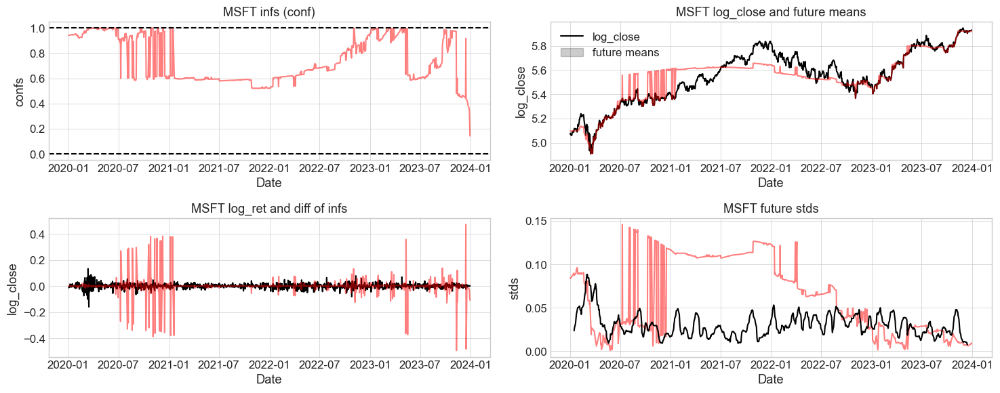

In [590]:
plot_futures('MSFT',start_date='2020-01-01',end_date='2024-01-01')

/var/folders/br/143tjw8148nftd61z3w9qzv40000gp/T/ipykernel_9964/3319052999.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F['confs'] = B/(B + F['infs'])                #confidence
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


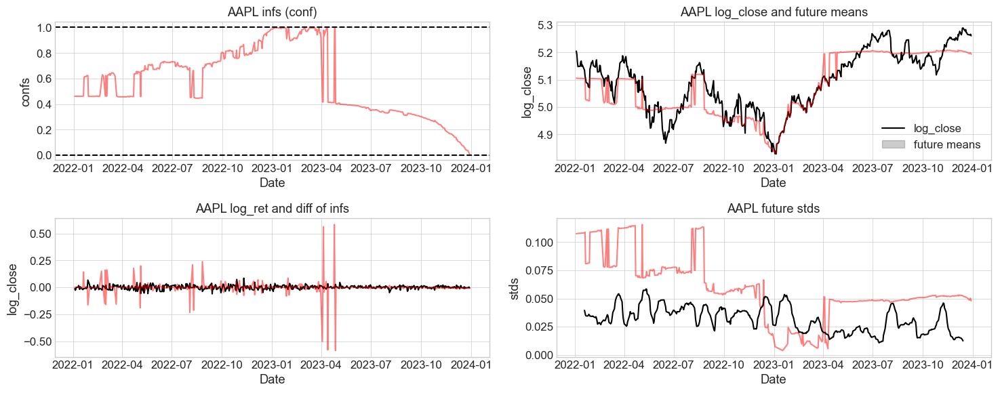

In [591]:
plot_futures('AAPL',start_date='2022-01-01',end_date='2024-01-01')

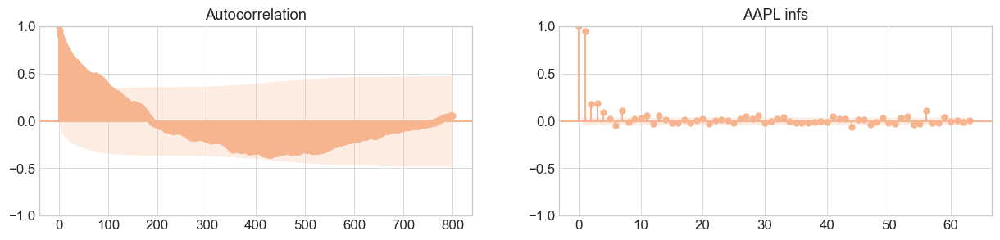

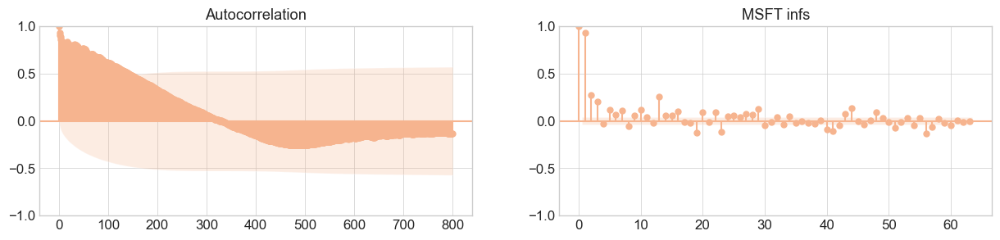

In [625]:
fig, ax = plt.subplots(1,2, figsize = (15,3))
sm.graphics.tsa.plot_acf(futures['AAPL']['infs'], lags=800,ax = ax[0])
sm.graphics.tsa.plot_pacf(futures['AAPL']['infs'], lags=63, ax=ax[1])
plt.title('AAPL infs')
plt.show()

fig, ax = plt.subplots(1,2, figsize = (15,3))
sm.graphics.tsa.plot_acf(futures['MSFT']['infs'], lags=800,ax = ax[0])
sm.graphics.tsa.plot_pacf(futures['MSFT']['infs'], lags=63, ax=ax[1])
plt.title('MSFT infs')
plt.show()

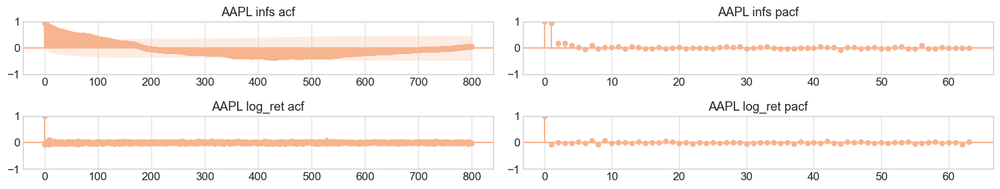

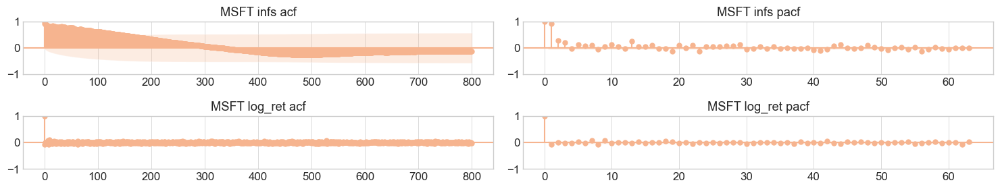

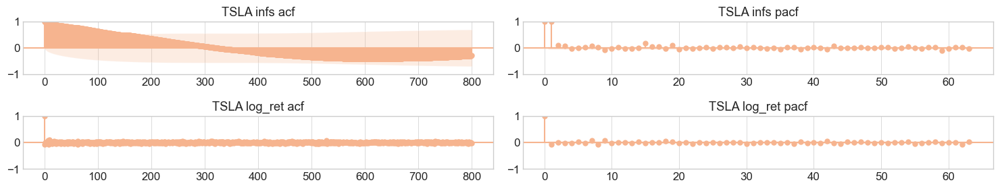

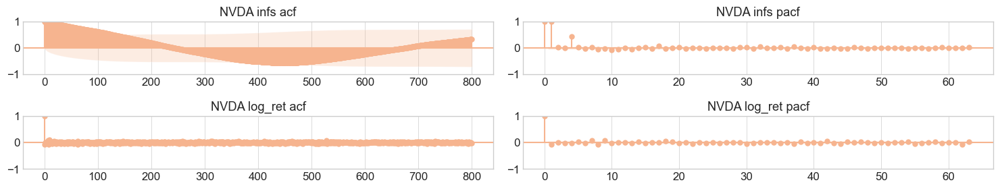

In [626]:
for ticker in shortlist:
    fig, ax = plt.subplots(2,2, figsize = (15,3))
    sm.graphics.tsa.plot_acf(futures[ticker]['infs'], lags=800,ax = ax[0,0], title = f'{ticker} infs acf')
    sm.graphics.tsa.plot_pacf(futures[ticker]['infs'], lags=63, ax=ax[0,1], title=f'{ticker} infs pacf')
    sm.graphics.tsa.plot_acf(df['AAPL']['log_ret'], lags=800,ax = ax[1,0], title = f'{ticker} log_ret acf')
    sm.graphics.tsa.plot_pacf(df['AAPL']['log_ret'], lags=63, ax=ax[1,1], title=f'{ticker} log_ret pacf')
    plt.tight_layout()
    plt.show()

In [365]:
start_date = '2020-06-01'
end_date = '2023-06-01'
test = infs_AAPL['log_close'].loc[start_date:end_date]

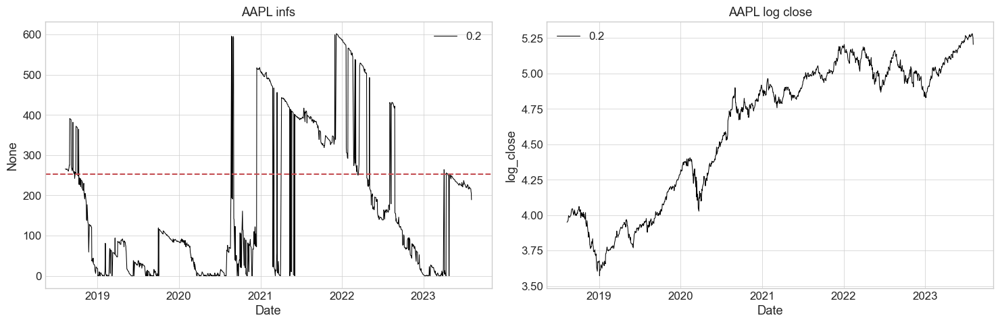

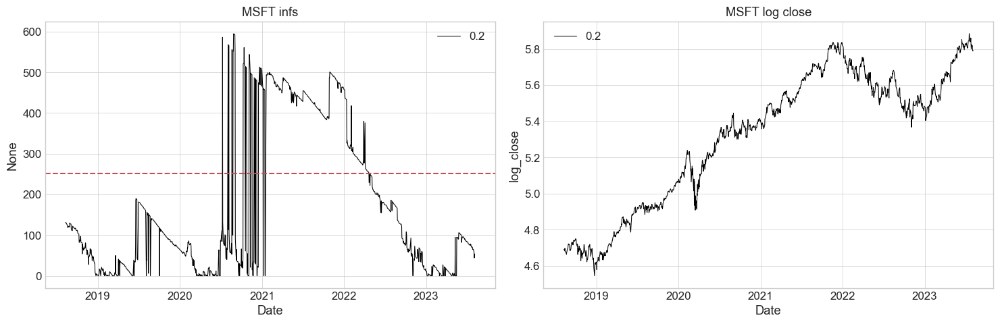

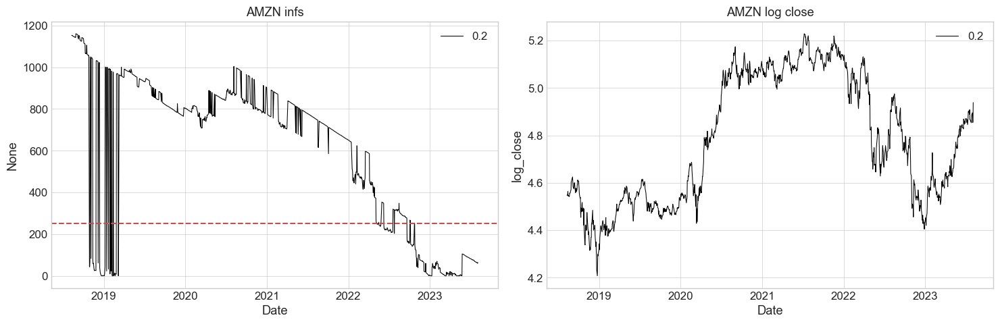

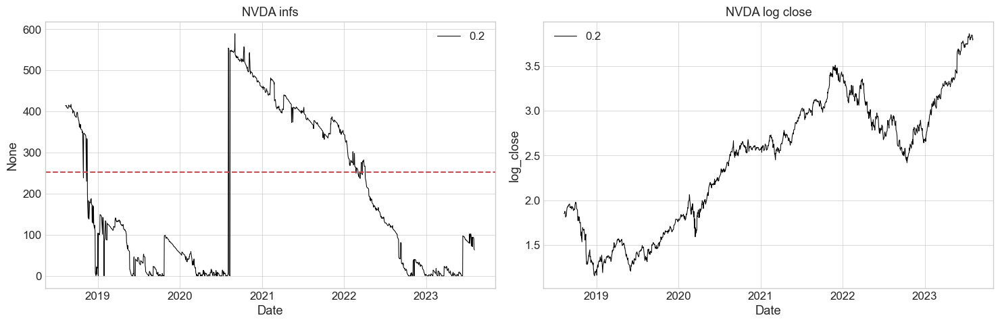

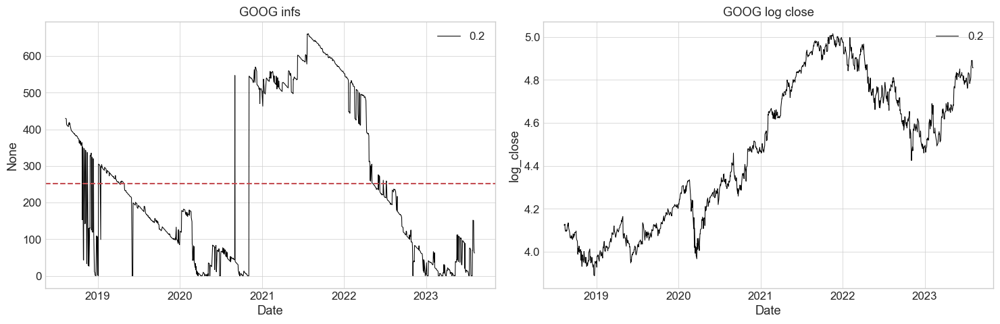

...

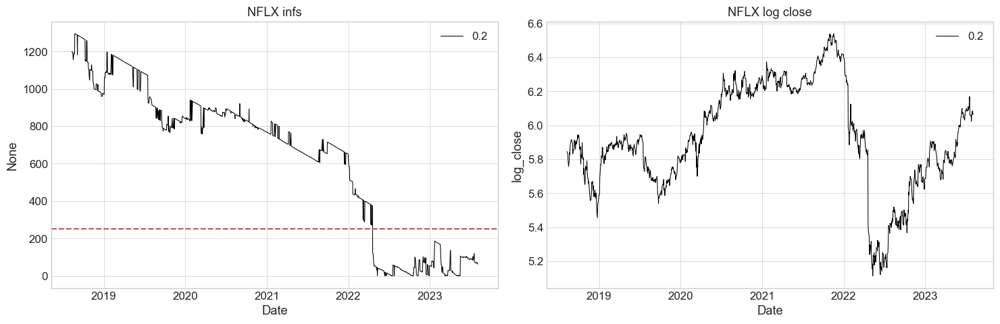

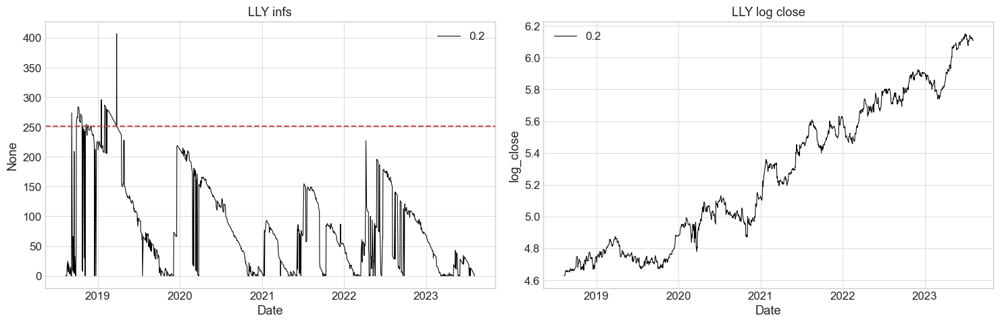

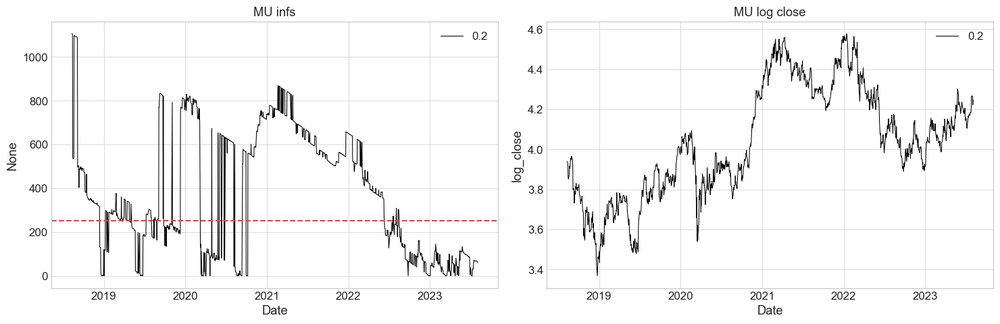

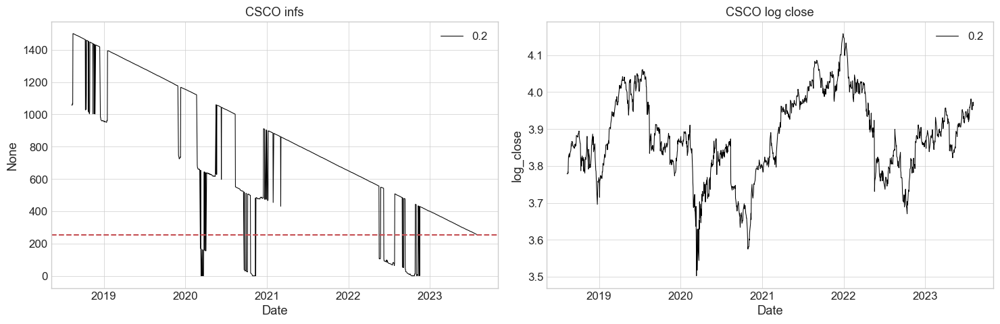

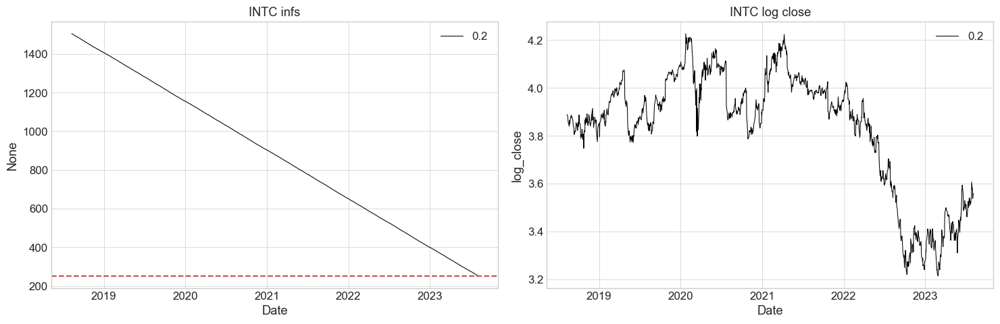

In [395]:
for i,ticker in enumerate(list_tickers):
    fig, ax = plt.subplots(1,2,figsize = (15,5))
    stock = df[ticker]['log_close']
    infs = future_inf(stock)
    sns.lineplot(x = infs.index, 
                y =infs,
                    size=0.2,
                    ax=ax[0],
                    color='black')
    #draw a horizontal line at 252
    ax[0].axhline(252, color='r', linestyle='--')
    ax[0].set_title(f'{ticker} infs')
    sns.lineplot(x=stock[:-252].index,
                 y=stock[:-252],
                 size=0.2,
                 ax=ax[1],
                 color='black')
    ax[1].set_title(f'{ticker} log close')
    plt.tight_layout()
    plt.show()

In [405]:
#range over tickers


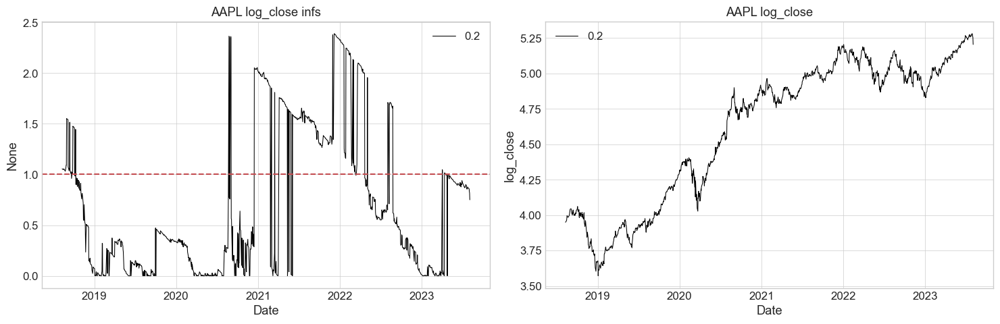

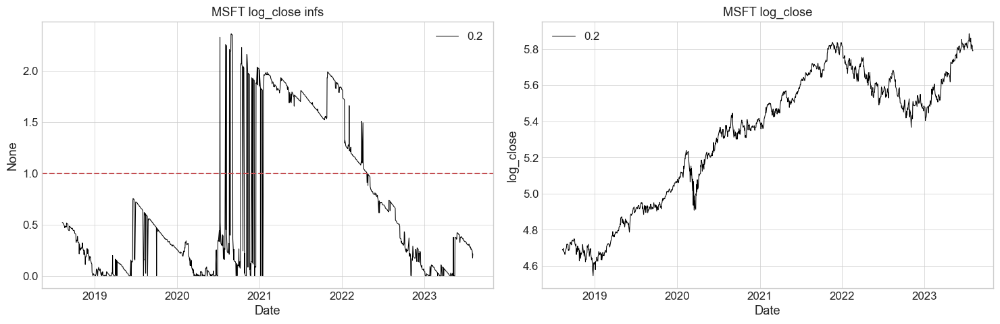

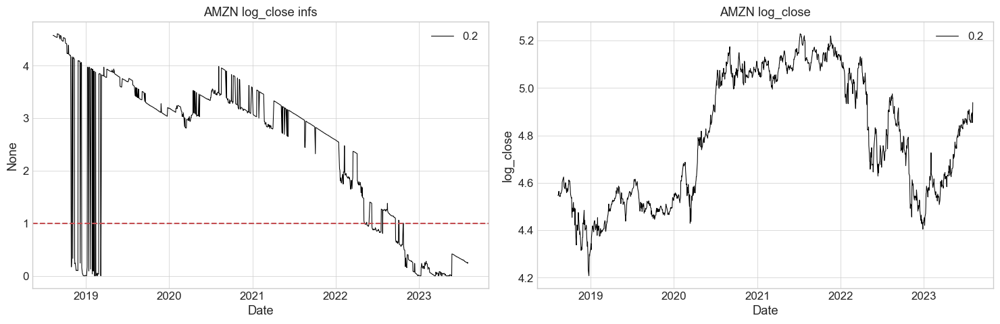

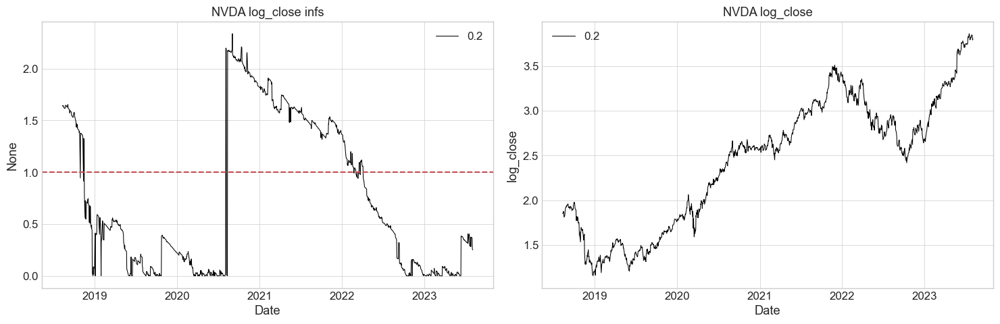

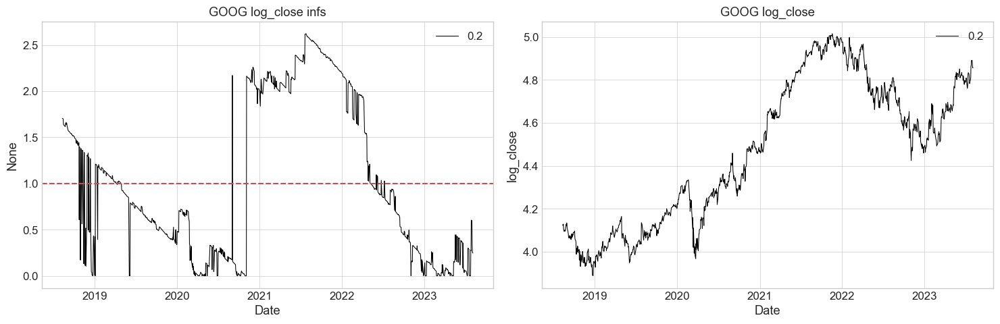

...

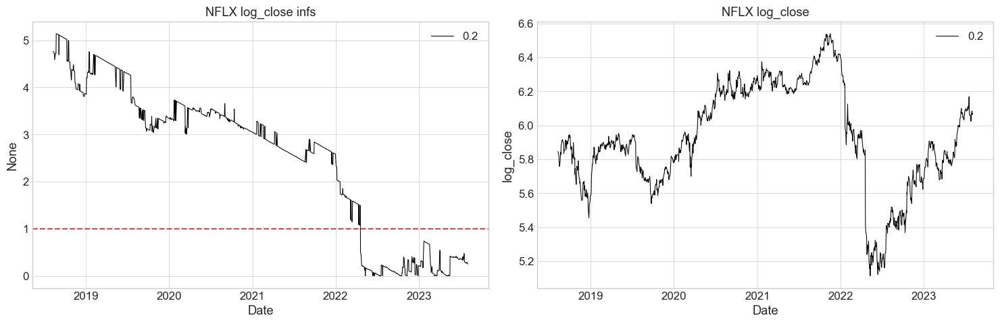

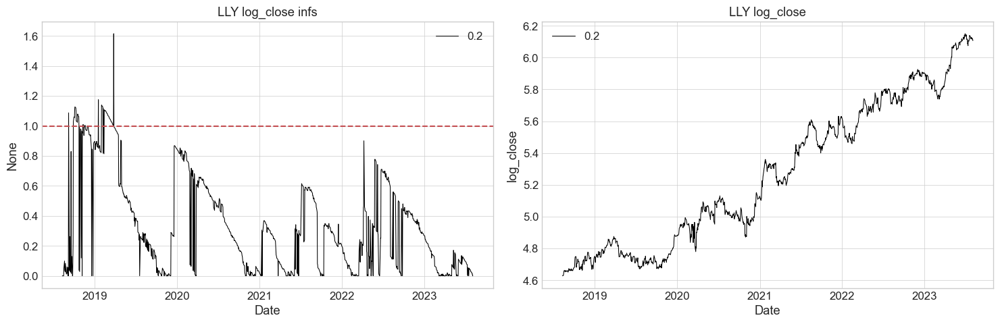

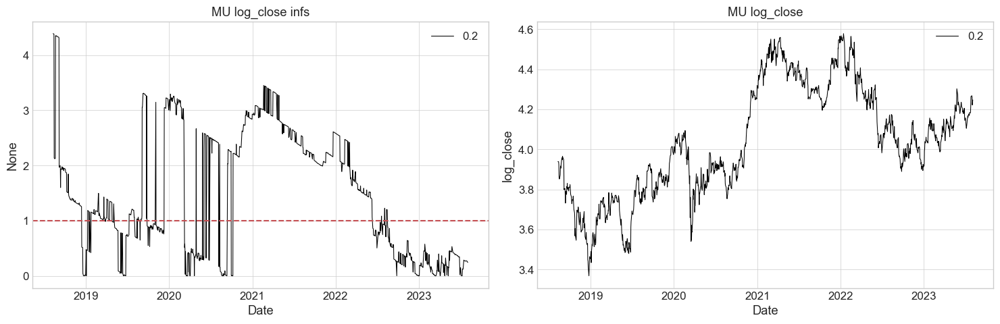

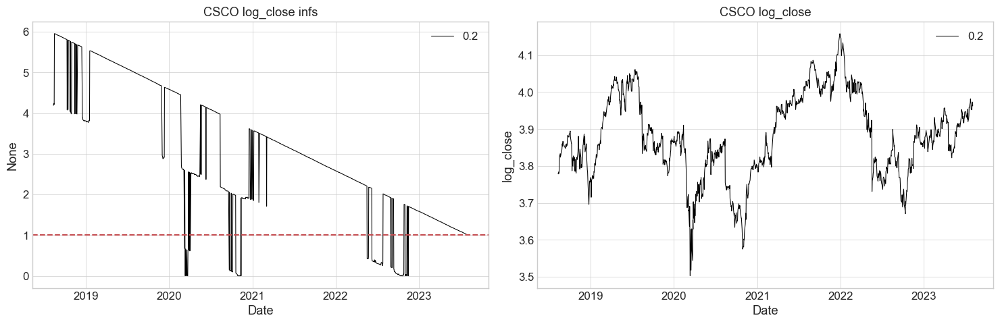

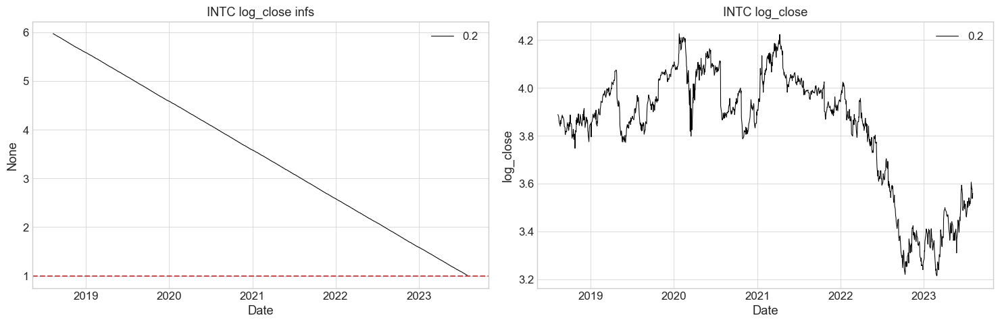

In [408]:
plot_infs(df,'log_close')

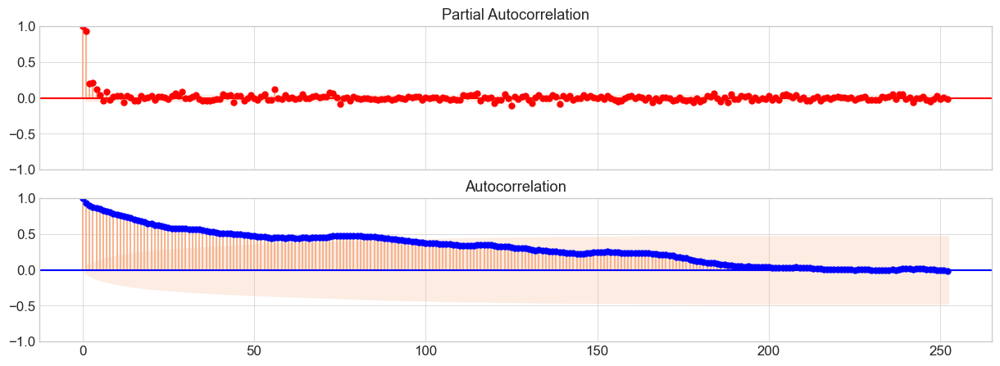

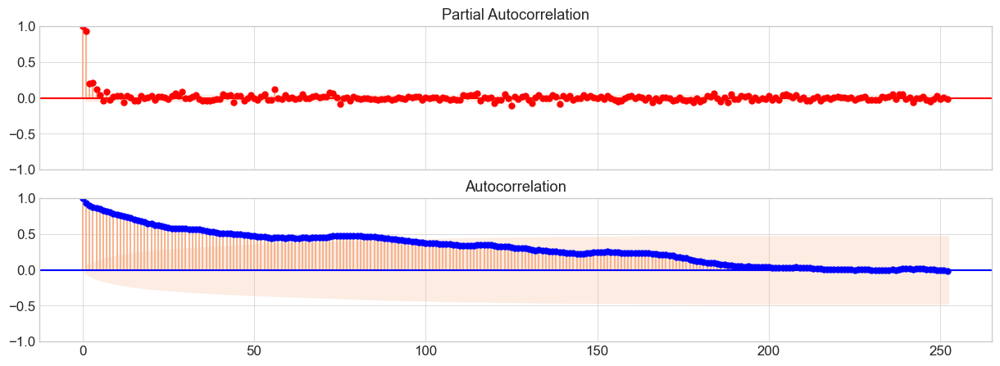

In [353]:
#plot the pcf and acf of infs_AAPL['log_close']
fig, ax = plt.subplots(2,figsize = (15, 5), sharex=True)
sm.graphics.tsa.plot_pacf(infs_AAPL['log_close'], lags=252, ax=ax[0],color='red')
sm.graphics.tsa.plot_acf(infs_AAPL['log_close'], lags=252, ax=ax[1],color='blue')

<Axes: xlabel='Date'>

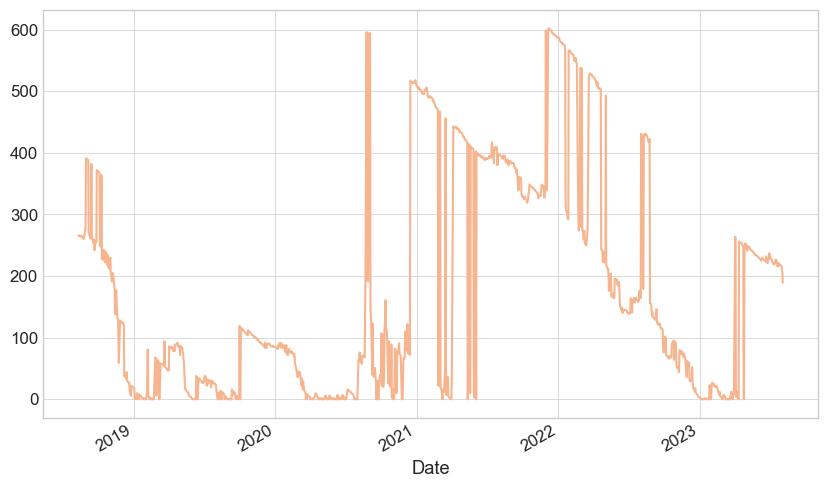

In [336]:
infs_AAPL['log_close'].plot()

In [344]:
infs_AAPL['log_close'].describe()

count    1254.000000
mean      178.897927
std       178.873653
min         0.000000
25%        20.250000
50%       103.500000
75%       325.750000
max       602.000000
Name: log_close, dtype: float64

/var/folders/br/143tjw8148nftd61z3w9qzv40000gp/T/ipykernel_9964/2112029702.py:6: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(infs_AAPL['log_close'], bins = 100, palette = sns.color_palette('viridis', n_colors = len(infs_AAPL)), kde = True)


<Axes: xlabel='log_close', ylabel='Count'>

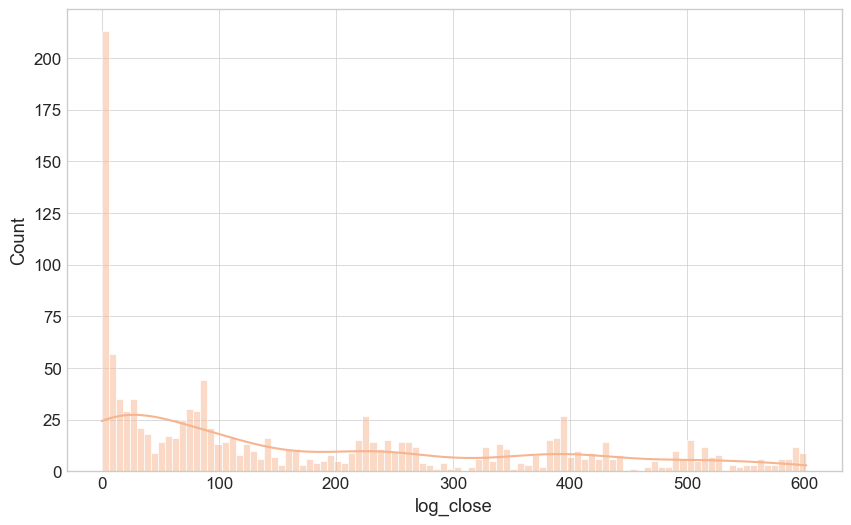

In [343]:
#plot histogram of infs_AAPL['log_close']
#use sns
#the color of the bars should vary with time
#use the parameter 'palette' in sns.histplot
#the number of bins should be 100
sns.histplot(infs_AAPL['log_close'], bins = 100, palette = sns.color_palette('viridis', n_colors = len(infs_AAPL)), kde = True)

In [119]:
df_AAPL = df_stocks['AAPL']
#drop the columns adj close and volume
df_AAPL = df_AAPL.drop(['Adj Close', 'Volume','Daily Return'], axis=1)

In [166]:
aapl = yf.Ticker('AAPL')
dir(aapl)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_analysis',
 '_data',
 '_download_options',
 '_earnings',
 '_earnings_dates',
 '_expirations',
 '_fast_info',
 '_fetch_ticker_tz',
 '_financials',
 '_fundamentals',
 '_get_ticker_tz',
 '_holders',
 '_isin',
 '_lazy_load_price_history',
 '_news',
 '_options2df',
 '_price_history',
 '_quote',
 '_shares',
 '_tz',
 '_underlying',
 'actions',
 'analyst_price_target',
 'balance_sheet',
 'balancesheet',
 'basic_info',
 'calendar',
 'capital_gains',
 'cash_flow',
 'cashflow',
 'dividends',
 'earnings',
 'earnings_dates',
 'earnings_forecasts',
 'earnings_trend',
 'fast_info',
 'financials',
 'get_actions',
 'get

In [183]:
aapl.history(period='5d')

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2024-07-31 00:00:00-04:00,221.440002,223.820007,220.630005,222.080002,50036300,0.0,0.0
2024-08-01 00:00:00-04:00,224.369995,224.479996,217.020004,218.360001,62501000,0.0,0.0
2024-08-02 00:00:00-04:00,219.149994,225.600006,217.710007,219.860001,105568600,0.0,0.0
2024-08-05 00:00:00-04:00,199.089996,213.500000,196.000000,209.270004,119548600,0.0,0.0
2024-08-06 00:00:00-04:00,205.300003,209.990005,201.070007,207.229996,69548700,0.0,0.0


In [181]:
aapl.get_cashflow()

,2023-09-30,2022-09-30,2021-09-30,2020-09-30,2019-09-30
FreeCashFlow,99584000000.0,111443000000.0,92953000000.0,73365000000.0,NaN
RepurchaseOfCapitalStock,-77550000000.0,-89402000000.0,-85971000000.0,-72358000000.0,NaN
RepaymentOfDebt,-11151000000.0,-9543000000.0,-8750000000.0,-12629000000.0,NaN
IssuanceOfDebt,5228000000.0,5465000000.0,20393000000.0,16091000000.0,NaN
IssuanceOfCapitalStock,NaN,NaN,1105000000.0,880000000.0,781000000.0
CapitalExpenditure,-10959000000.0,-10708000000.0,-11085000000.0,-7309000000.0,NaN
InterestPaidSupplementalData,3803000000.0,2865000000.0,2687000000.0,3002000000.0,NaN
IncomeTaxPaidSupplementalData,18679000000.0,19573000000.0,25385000000.0,9501000000.0,NaN
EndCashPosition,30737000000.0,24977000000.0,35929000000.0,39789000000.0,NaN
BeginningCashPosition,24977000000.0,35929000000.0,39789000000.0,50224000000.0,NaN


In [177]:
aapl.get_info()

{'address1': 'One Apple Park Way',
 'city': 'Cupertino',
 'state': 'CA',
 'zip': '95014',
 'country': 'United States',
 'phone': '408 996 1010',
 'website': 'https://www.apple.com',
 'industry': 'Consumer Electronics',
 'industryKey': 'consumer-electronics',
 'industryDisp': 'Consumer Electronics',
 'sector': 'Technology',
 'sectorKey': 'technology',
 'sectorDisp': 'Technology',
 'longBusinessSummary': 'Apple Inc. designs, manufactures, and markets smartphones, personal computers, tablets, wearables, and accessories worldwide. The company offers iPhone, a line of smartphones; Mac, a line of personal computers; iPad, a line of multi-purpose tablets; and wearables, home, and accessories comprising AirPods, Apple TV, Apple Watch, Beats products, and HomePod. It also provides AppleCare support and cloud services; and operates various platforms, including the App Store that allow customers to discover and download applications and digital content, such as books, music, video, games, and pod

In [474]:
#write a function that accepts a dataframe, lookback,  list of window sizes, and list of bin widths
#create a subplots object with rows equal to the number of columns in the dataframe and two columns
#in the ith row and 0th column, plot df[column] in black with transperancy 0.5. Also, plot the rolling mean of df[column] for each window in window_sizes. The color of the rolling mean should increase from 0.3 to 1 as the window size increases. Use the colormap magma_r. Label each rolling mean graph with the corresponding window size preceded by 'w = '.
#in the ith row and 1st column, plot the histogram of df[column] for each bin width in the list. On the same plot, plot the kernel density estimate of df[column] in red. Label the histogram 'Histogram' and the kernel density estimate 'KDE'. Fill in the area under the KDE curve with a color. Use the colormap viridis for the color. 

def plot_rolling(df, lookback, window_sizes):
    n = len(df.columns)
    fig, axs = plt.subplots(n, 2, figsize=(12, 2*n))
    #set color palette to rocket
    for i, col in enumerate(df.columns):
        series = df[col]
        axs[i, 0].plot(series[-lookback:], color='black', alpha=0.7, linewidth=0.5)
        for j, window in enumerate(window_sizes):
            sns.set_palette('rocket_r')
            means = series.rolling(window, center=True).mean()
            sns.lineplot(means[-lookback:],
                         label=f'w = {window}',
                        #  palette='rocket_r',
                         linewidth=0.7,
                         ax=axs[i, 0])
        axs[i, 0].legend()
        axs[i, 0].set_title(f'{col} Rolling Means')
        for j in [8, 16, 20, 30, 50]:
            sns.histplot(series, 
                         bins=j, 
                         alpha=0.3, 
                         edgecolor='none',
                         kde=True,
                         ax=axs[i, 1]
                        #  palette='rocket'
                         )
            # axs[i, 1].hist(series, 
            #                bins=width, 
            #                density=True, 
            #                alpha=0.3, 
            #                color=plt.cm.viridis(0.3 + 0.7*j/len(bin_widths)),
            #                edgecolor='none')
            # sns.kdeplot(series, color='red', ax=axs[i, 1])
            axs[i, 1].set_title(f'{col} Histogram and KDE')
    plt.tight_layout()
    plt.show()

In [475]:
#retrieve the total volume of AAPL stocks using yfinance
aapl = yf.Ticker('AAPL')
aapl_info = aapl.info
aapl_info['volume']

18400162

In [150]:
aapl_balance_sheet = aapl.get_balance_sheet(freq='quarterly').T[:-1]
list(aapl_balance_sheet.columns)

['TreasurySharesNumber',
 'OrdinarySharesNumber',
 'ShareIssued',
 'NetDebt',
 'TotalDebt',
 'TangibleBookValue',
 'InvestedCapital',
 'WorkingCapital',
 'NetTangibleAssets',
 'CapitalLeaseObligations',
 'CommonStockEquity',
 'TotalCapitalization',
 'TotalEquityGrossMinorityInterest',
 'StockholdersEquity',
 'GainsLossesNotAffectingRetainedEarnings',
 'OtherEquityAdjustments',
 'RetainedEarnings',
 'CapitalStock',
 'CommonStock',
 'TotalLiabilitiesNetMinorityInterest',
 'TotalNonCurrentLiabilitiesNetMinorityInterest',
 'OtherNonCurrentLiabilities',
 'TradeandOtherPayablesNonCurrent',
 'LongTermDebtAndCapitalLeaseObligation',
 'LongTermCapitalLeaseObligation',
 'LongTermDebt',
 'CurrentLiabilities',
 'OtherCurrentLiabilities',
 'CurrentDeferredLiabilities',
 'CurrentDeferredRevenue',
 'CurrentDebtAndCapitalLeaseObligation',
 'CurrentCapitalLeaseObligation',
 'CurrentDebt',
 'OtherCurrentBorrowings',
 'CommercialPaper',
 'PayablesAndAccruedExpenses',
 'Payables',
 'TotalTaxPayable',
 'In

In [154]:
aapl_balance_sheet = aapl_balance_sheet[['OrdinarySharesNumber','TangibleBookValue','TotalAssets','StockholdersEquity','RetainedEarnings','TotalLiabilitiesNetMinorityInterest']]
aapl_balance_sheet

,OrdinarySharesNumber,TangibleBookValue,TotalAssets,StockholdersEquity,RetainedEarnings,TotalLiabilitiesNetMinorityInterest
2024-03-31,15337686000.0,74194000000.0,337411000000.0,74194000000.0,4339000000.0,263217000000.0
2023-12-31,15460223000.0,74100000000.0,353514000000.0,74100000000.0,8242000000.0,279414000000.0
2023-09-30,15550061000.0,62146000000.0,352583000000.0,62146000000.0,-214000000.0,290437000000.0
2023-06-30,15647868000.0,60274000000.0,335038000000.0,60274000000.0,1408000000.0,274764000000.0
2023-03-31,15723406000.0,62158000000.0,332160000000.0,62158000000.0,4336000000.0,270002000000.0


In [637]:
aapl_2 = yf.Ticker('AAPL')

In [638]:
aapl_2.get_balance_sheet(freq='quarterly').T

""


In [635]:
aapl_2.history(start = '2020-01-01', end = '2021-01-01')

$AAPL: possibly delisted; No price data found  (1d 2020-01-01 -> 2021-01-01)


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,


In [162]:
aapl_shares = aapl.get_balance_sheet().T[['OrdinarySharesNumber']].dropna()
aapl_shares

,OrdinarySharesNumber
2023-09-30,15550061000.0
2022-09-30,15943425000.0
2021-09-30,16426786000.0
2020-09-30,16976763000.0


In [157]:
list(aapl_financials.columns)

['TaxEffectOfUnusualItems',
 'TaxRateForCalcs',
 'NormalizedEBITDA',
 'NetIncomeFromContinuingOperationNetMinorityInterest',
 'ReconciledDepreciation',
 'ReconciledCostOfRevenue',
 'EBITDA',
 'EBIT',
 'NetInterestIncome',
 'InterestExpense',
 'InterestIncome',
 'NormalizedIncome',
 'NetIncomeFromContinuingAndDiscontinuedOperation',
 'TotalExpenses',
 'TotalOperatingIncomeAsReported',
 'DilutedAverageShares',
 'BasicAverageShares',
 'DilutedEPS',
 'BasicEPS',
 'DilutedNIAvailtoComStockholders',
 'NetIncomeCommonStockholders',
 'NetIncome',
 'NetIncomeIncludingNoncontrollingInterests',
 'NetIncomeContinuousOperations',
 'TaxProvision',
 'PretaxIncome',
 'OtherIncomeExpense',
 'OtherNonOperatingIncomeExpenses',
 'NetNonOperatingInterestIncomeExpense',
 'InterestExpenseNonOperating',
 'InterestIncomeNonOperating',
 'OperatingIncome',
 'OperatingExpense',
 'ResearchAndDevelopment',
 'SellingGeneralAndAdministration',
 'GrossProfit',
 'CostOfRevenue',
 'TotalRevenue',
 'OperatingRevenue']

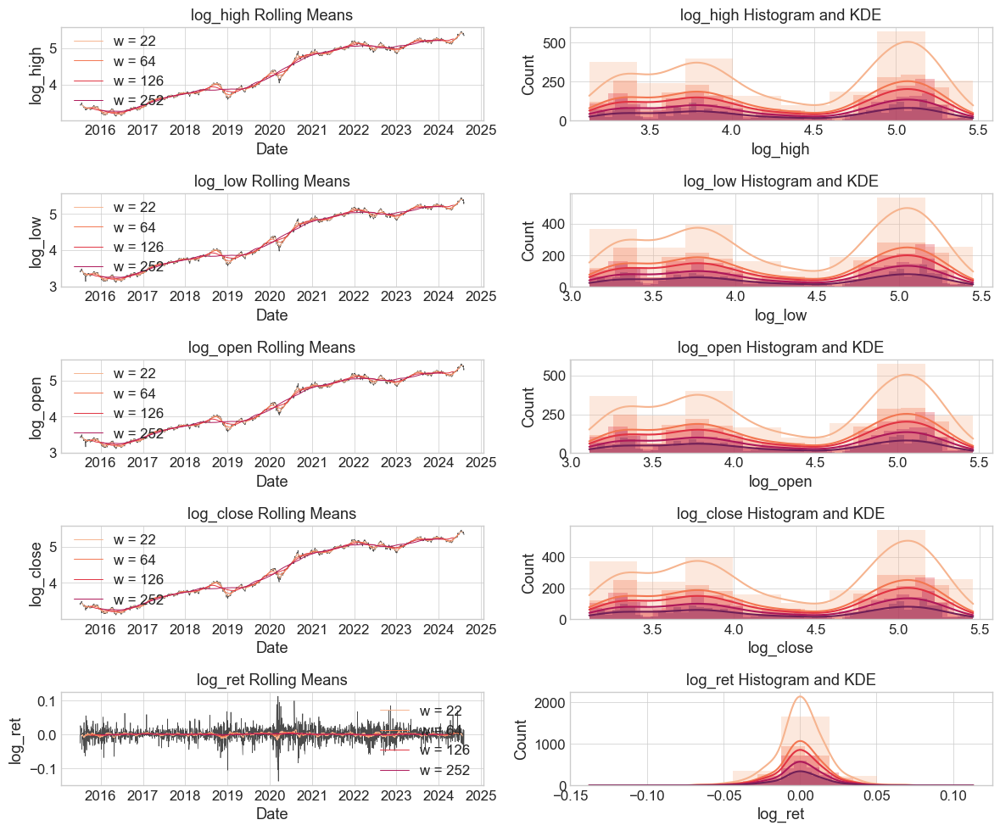

In [479]:
#add a new column to df_AAPL whose values are log returns divided by log volume
plot_rolling(df_AAPL, 
             lookback=len(df_AAPL), 
             window_sizes=[22, 64, 126, 252])

In [111]:
#use the stats module of scipy to calculate the Anderson-Darling test statistic for the log returns of df_AAPL
#store the result in andar_result_AAPL
from scipy import stats

def and_dar_test(logret, stock):
    # fig, ax = plt.subplots(2, figsize=(12, 6))
    plt.figure(figsize=(12, 4))
    sns.set_palette('rocket')
    result = stats.anderson(logret, dist='norm')
    for j in [0.8,0.25]:
        sns.kdeplot(logret,  
                    label=f'kde {j}', 
                    fill=True,
                    bw_adjust=j,
                    common_norm=False
                    )
    # for j in [1,0.5,0.3]:
        # sns.histplot(logret,
        #              bins=j,
        #              alpha=0.3,
        #              edgecolor='none',
        #             #  kde=True,
        #              label=f'bins = {j}',
        #              element='poly',
        #              ax = ax[0]
        #              )
        
                    # ax = ax[1])
    plt.legend()
    plt.title(f'KDE of {stock}')
    plt.show()

    # Print the test statistic and critical values
    print(f"Anderson-Darling Test Statistic: {result.statistic:.4f}")
    print("Critical Values:")
    for i, crit_value in enumerate(result.critical_values):
        print(f"Level {result.significance_level[i]}%: {crit_value:.4f}")
    print('---------')

    # Check the p-value
    if result.statistic < result.critical_values[0]:
        print("The log returns appear follow a normal distribution. Therefore the stock data could be reasonably modeled under the assumption that the log returns follow a normal distribution.")
    else:
        print("Reject the null hypothesis that the log returns follow a normal distribution.")

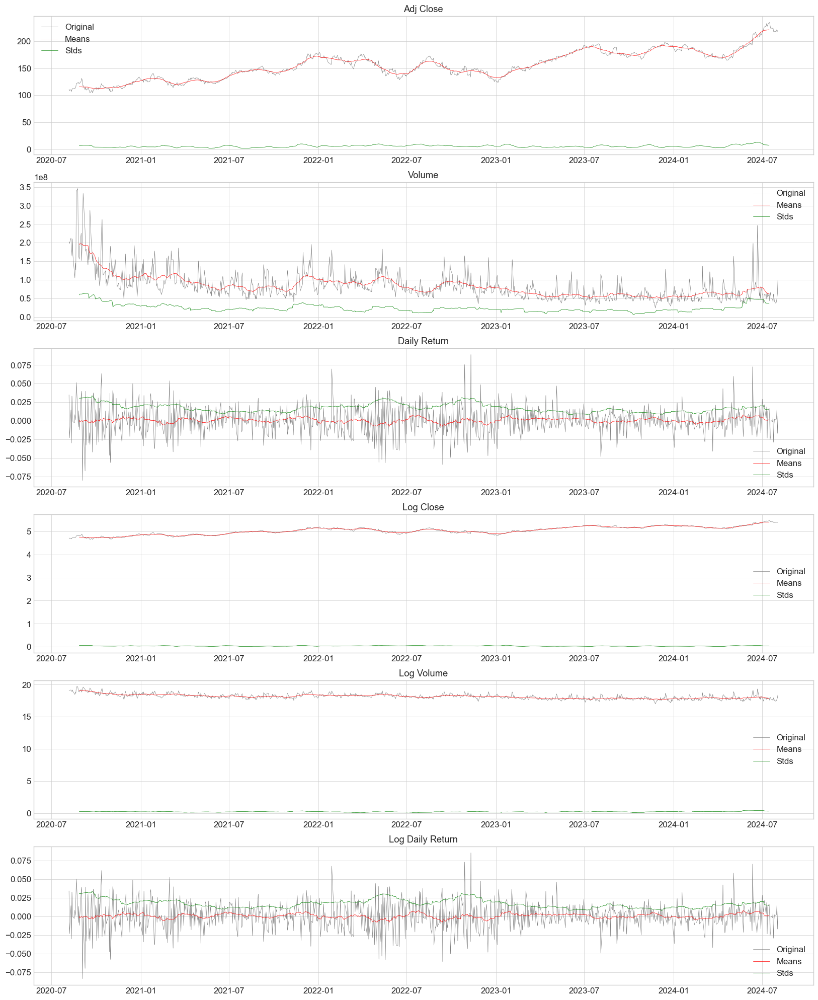

In [72]:
#plot the rolling means and stds of each column in df_AAPL. 
#on the each subplot, plot the original time series in gray, the rolling means in red, and the rolling stds in green
#make the line width thinner
fig, ax = plt.subplots(6, 1, figsize=(20, 25))
for i, col in enumerate(df_AAPL.columns):
    means_and_stds = rolling_means_and_stds(df_AAPL[col], 30)
    ax[i].plot(df_AAPL[col], color='grey', label='Original', linewidth=0.5)
    ax[i].plot(means_and_stds['Means'], color='red', label='Means', linewidth=0.5)
    ax[i].plot(means_and_stds['Stds'], color='green', label='Stds', linewidth=0.5)
    ax[i].set_title(col)
    ax[i].legend()

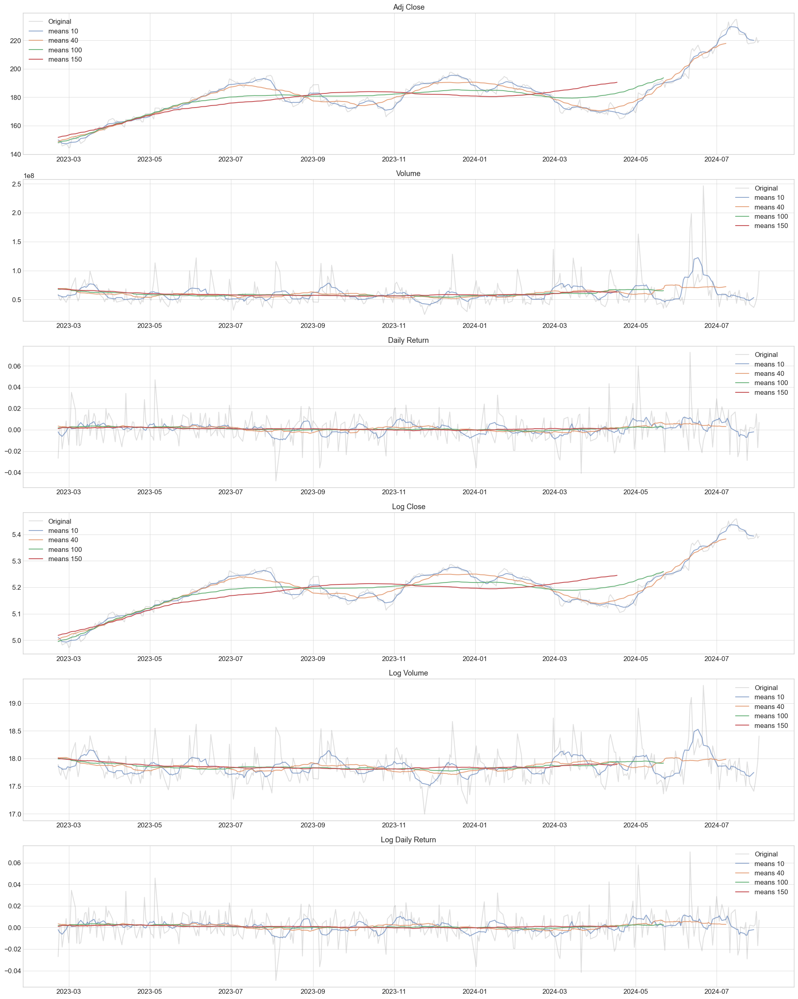

In [94]:
#Let's explore how the graphs of the rolling means of the columns as we increase the window size
#The colors of the lines should get darker as the window size increases
#Plot only the data for the last year of the time series
fig, ax = plt.subplots(6, 1, figsize=(20, 25))
for i, col in enumerate(df_AAPL.columns):
    ax[i].plot(df_AAPL[col][-365:], color='grey', label='Original', alpha=0.25)
    for j, window in enumerate([10,40,100,150]):
        means_and_stds = rolling_means_and_stds(df_AAPL[col], window)
        ax[i].plot(means_and_stds['Means'][-365:], label=f'means {window}', alpha=0.5 + 0.125*(j+1))
        # ax[i].plot(means_and_stds['Stds'], label=f'Stds, Window={window}', alpha=window/100)
    ax[i].set_title(col)
    ax[i].legend()
plt.tight_layout()
plt.show()

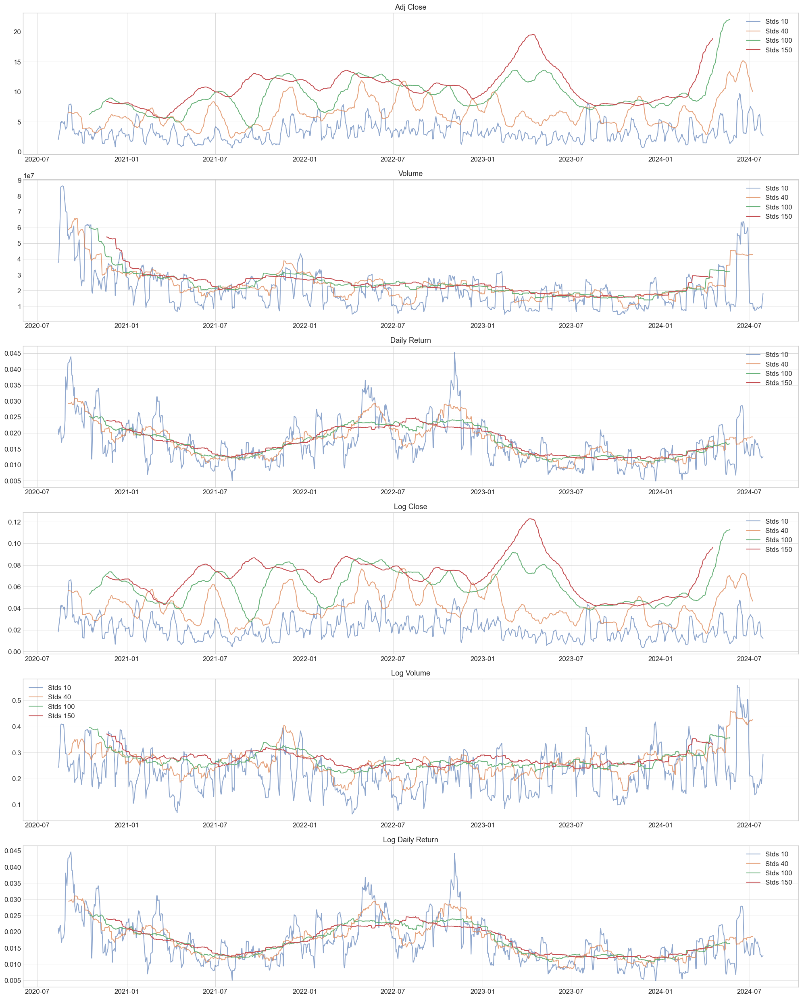

In [101]:
#Let's explore how the graphs of the rolling stds of the columns as we increase the window size
#The colors of the lines should get darker as the window size increases
#Plot only the data for the last year of the time series
fig, ax = plt.subplots(6, 1, figsize=(20, 25))
for i, col in enumerate(df_AAPL.columns):
    for j, window in enumerate([10,40,100,150]):
        means_and_stds = rolling_means_and_stds(df_AAPL[col], window)
        # ax[i].plot(means_and_stds[''][-365:], label=f'means {window}', alpha=0.5 + 0.125*(j+1))
        ax[i].plot(means_and_stds['Stds'], label=f'Stds {window}', alpha= 0.5 + 0.125*(j+1))
    ax[i].set_title(col)
    ax[i].legend()
plt.tight_layout()
plt.show()

In [88]:
#make a datafram df_AAPL_diff that contains the first difference of each column in df_AAPL. For each column name, the new column name should be the original column name with ' diff' appended to it
df_AAPL_diff = df_AAPL.diff()
df_AAPL_diff.columns = [col + ' diff' for col in df_AAPL_diff.columns]
df_AAPL_diff = df_AAPL_diff.dropna()
df_AAPL_diff

,Adj Close diff,Volume diff,Daily Return diff,Log Close diff,Log Volume diff,Log Daily Return diff
Date,,,,,,
2020-08-07,-2.529099,-4383200.0,-0.057625,-0.022998,-0.021891,-0.057293
2020-08-10,1.580086,14358000.0,0.037271,0.014430,0.069991,0.037428
2020-08-11,-3.280022,-24501200.0,-0.044275,-0.030191,-0.122566,-0.044621
2020-08-12,3.556419,-22304400.0,0.062975,0.032694,-0.126360,0.062885
2020-08-13,1.956718,44484000.0,-0.015537,0.017542,0.237935,-0.015152
...,...,...,...,...,...,...
2024-07-29,0.279999,-5289500.0,-0.000876,0.001284,-0.135989,-0.000875
2024-07-30,0.559998,5332000.0,0.001281,0.002563,0.137010,0.001279
2024-07-31,3.279999,8392500.0,0.012425,0.014880,0.183596,0.012317
